# Self-supervised attempt and Zero-shot SR testing

In [1]:
!pip install pyhdf pytorch-ignite -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 771.6/771.6 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 312.7/312.7 kB 15.5 MB/s eta 0:00:00


In [4]:
import os
import PIL
import torch
import torch.nn.functional as F
import torchvision
import torchvision.transforms as tt
import torchvision.transforms.functional as ttf

from ignite.engine import *
from ignite.handlers import *
from ignite.metrics import *
from ignite.metrics.regression import *
from ignite.utils import *

import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from pyhdf.SD import SD, SDC
from skimage.metrics import structural_similarity as ssim_sk
#from piqa import SSIM
from srcnn import *
from unet import *
from resunet import *
from haunet import *
from mrunet import *
from zssrnet import *


DEVICE  = "cuda:0" if torch.cuda.is_available() else "cpu"
UP_SCALE = 10
SEED = 8609
np.random.seed(SEED)


def eval_step(engine, batch):
    return batch
evaluator = Engine(eval_step)

class CustomSSIM:
    """SSIM stimated by torch.ignite"""
    def __init__(self, evaluator):
        self.name="SSIM"
        self.evaluator = evaluator
        self.metric = SSIM(data_range=1.0)
        self.metric.attach(self.evaluator, "ssim")
    def __call__(self, lr, hr):
        state = self.default_evaluator.run([[preds, target]])
        return self.metrics["ssim"]

class PSNR: #### check out img range for grayscale [0,1]
    """Peak Signal to Noise Ratio"""
    def __init__(self):
        self.name = "PSNR"
    @staticmethod
    def __call__(img1, img2):
        mse = torch.mean((img1 - img2) ** 2)
        return (20 * torch.log10(255.0 / torch.sqrt(mse))).item()

psnr = PSNR()
ssim = CustomSSIM(evaluator)

print("Is cuda available?", torch.cuda.is_available())

Is cuda available? True



---

# Testing ZSSR using RGB image

Testing Zero-shot Super Resolution with RGB image from Imagenet-A

torch.Size([3, 200, 200])
Original tensor dimension: torch.Size([1, 3, 200, 200])


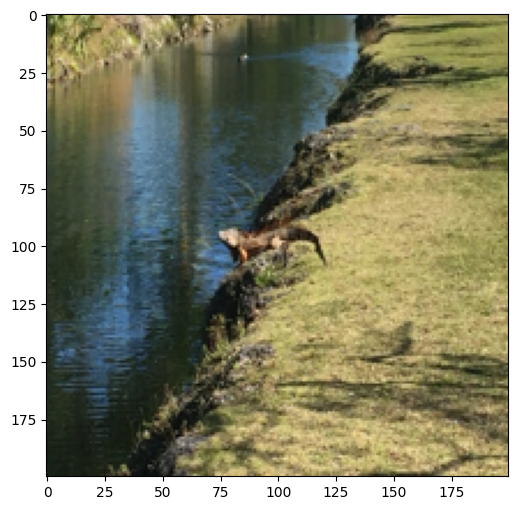

In [ ]:
# Testing zsrr with alligator.jpg
imgfilename = "alligator.jpg"
resizedim = (200,200)

# Loading image (to tensor)
img = PIL.Image.open(imgfilename).convert("RGB").resize(resizedim)

# Channel selection
nchannels = 3
hr  = ttf.to_tensor(img) if nchannels == 3 else ttf.to_tensor(img)[0,:,:]
print(hr.shape)

# Normalization and params extractions (for plotting purposes)
hr = hr / hr.max()

hr = hr.reshape(1, nchannels, hr.shape[-2], hr.shape[-1])
print("Original tensor dimension:", hr.shape)

# Plotting
_, axs = plt.subplots(1, 1, figsize=(6,6))
axs.imshow(img)
plt.show()

### Rescaling
Pretext original image degradation via bicubic interpolation according to a given `scale_factor`

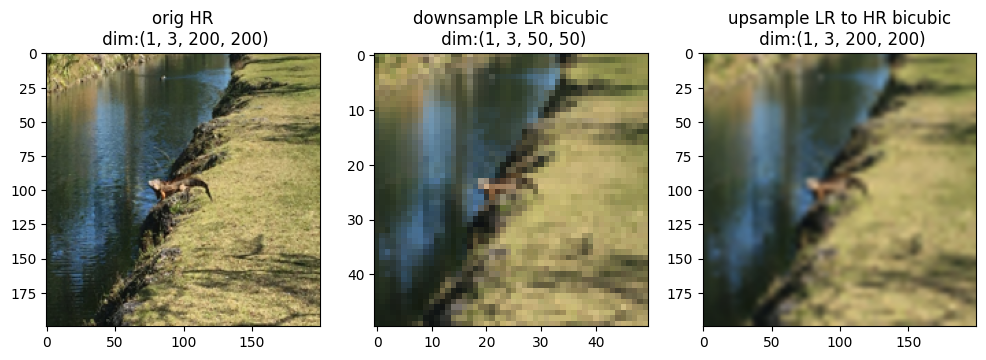

In [ ]:
scale_factor = 4

# Down and Up scaling via bicubic interpolation
child    = F.interpolate(hr, scale_factor=1/scale_factor, mode="bicubic", antialias=True)
child_up = F.interpolate(child, scale_factor=scale_factor, mode="bicubic", antialias=True)

# Plot
titles = ["orig HR", "downsample LR bicubic", "upsample LR to HR bicubic"]
toplot = (hr, child, child_up)
_, axs = plt.subplots(1,len(toplot),figsize=(12,6))
for i,item in enumerate(toplot):
    axs[i].imshow(ttf.to_pil_image(item.squeeze()))
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

### Model initialization

In [ ]:
#model = ZSSRNet(input_channels=nchannels, kernel_size=3, channels=64).to(DEVICE)
model = build_unet(nchannels=nchannels).to(DEVICE)
#model = build_resunet(nchannels=nchannels).to(DEVICE)
#model = build_haunet(scale_factor, nchannels=nchannels, multi_image=False).to(DEVICE)
#model = MRUNet(n_channels=nchannels, n_resblocks=1).to(DEVICE)

# Training specs
loss_function = torch.nn.L1Loss()
optimizer     = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.99)

#scheduler     = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
#                    factor=0.9, patience=5, threshold=0.0001, threshold_mode='abs')

# To DEVICE
hr = hr.to(DEVICE)
child = child.to(DEVICE)
child_up = child_up.to(DEVICE)

def adjust_learning_rate(optimizer, new_lr):
    """Manually adjusting lr for a given optimizer
    """
    for param_group in optimizer.param_groups:
        param_group['lr'] = new_lr

### Training Loop

100%|██████████| 600/600 [00:26<00:00, 22.58it/s,  Training Loss « 0.0038711654 »]


 SR-HR:  PSNR (93.851463)  MAE (0.0038711654)
 LR-HR:  PSNR (71.599533)  MAE (0.0463126861)


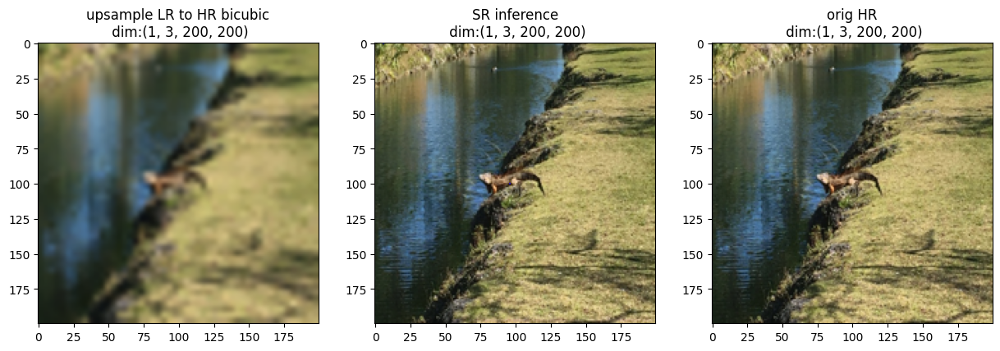

In [ ]:
# Training params
nepochs = 600
adjust_learning_rate(optimizer, 10e-4)

# Training loop
model.train()
progression_bar = tqdm(range(nepochs), total=nepochs)
for e in progression_bar:
    output = model(child_up).to(DEVICE)
    loss = loss_function(output, hr)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    #scheduler.step()
    progression_bar.set_postfix_str(f" Training Loss « {(loss.item()):.10f} »")

# Inference Eval
psnr = PSNR()
print(f" SR-HR:  PSNR ({psnr(output, hr):.6f})  MAE ({loss_function(output, hr):.10f})")
print(f" LR-HR:  PSNR ({psnr(child_up, hr):.6f})  MAE ({loss_function(child_up, hr):.10f})")

# Plot
titles = ["upsample LR to HR bicubic", "SR inference", "orig HR"]
toplot = (child_up, output, hr)
_, axs = plt.subplots(1,len(toplot),figsize=(15,6))
for i,item in enumerate(toplot):
    axs[i].imshow(ttf.to_pil_image(item.squeeze().detach().to("cpu")))

    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

### Now testing zeroshot upscaling
Original HR upsampling according to `scale_factor` and bicubic interpolation.

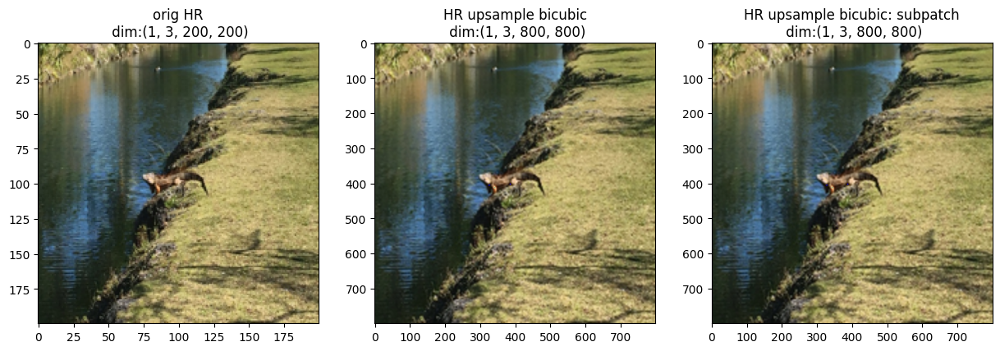

In [ ]:
hr_up = F.interpolate(hr, scale_factor=scale_factor, mode="bicubic", antialias=True)
hr_up = hr_up.to(DEVICE)

# Subpatch selection
patch_size = (800,800)
hr_up_subpatch = tt.Compose([tt.RandomCrop(patch_size)])(hr_up)

# Plot
titles = ["orig HR", "HR upsample bicubic", "HR upsample bicubic: subpatch"]
toplot = (hr, hr_up, hr_up_subpatch)
_, axs = plt.subplots(1,len(toplot),figsize=(15,6))
for i,item in enumerate(toplot):
    axs[i].imshow(ttf.to_pil_image(item.squeeze().detach().to("cpu")))
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

Self-supervised trained model inference estimation.

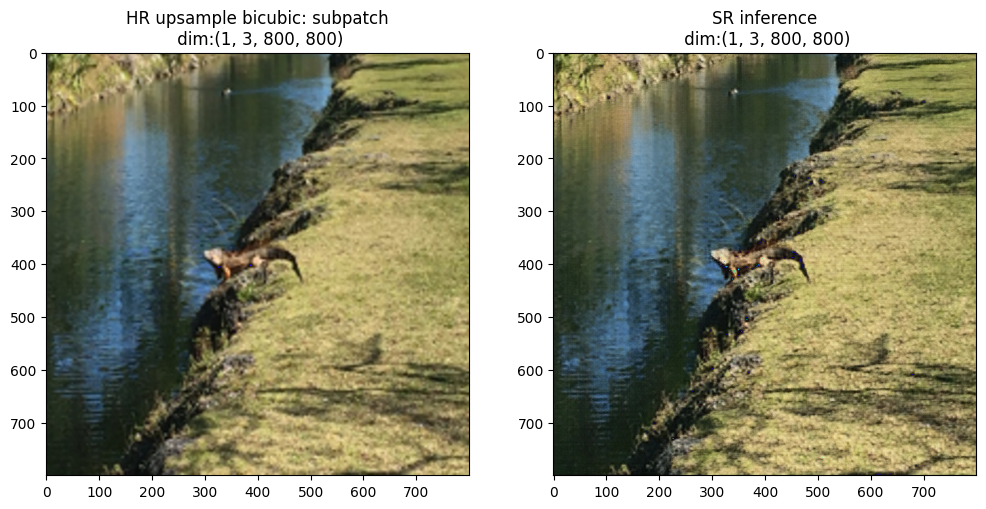

In [ ]:
# Evaluating over the new upscaled version
model.eval()
with torch.no_grad():
    inference = model(hr_up_subpatch).to(DEVICE)

# Plot
titles = ["HR upsample bicubic: subpatch", "SR inference"]
toplot = (hr_up_subpatch, inference)
_, axs = plt.subplots(1,len(toplot),figsize=(12,8))
for i,item in enumerate(toplot):
    axs[i].imshow(ttf.to_pil_image(item.squeeze().detach().to("cpu")))
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

### Residual mapping

Avg bias: 0.0007135033956728876


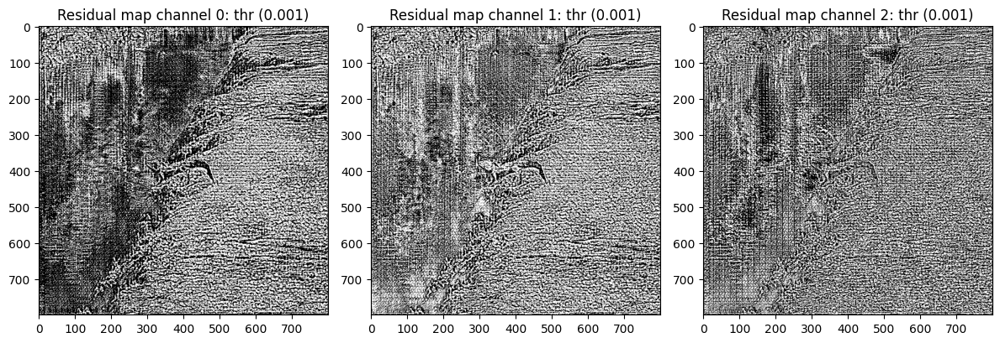

In [ ]:
thr = 0.001
diff = inference.detach().to("cpu").squeeze() - hr_up_subpatch.detach().to("cpu").squeeze()
print("Avg bias:", diff.float().mean().item())

diff = torch.where(diff>thr, 1, 0)

toplot = [diff[i,:,:] for i in range(3)]
_, axs = plt.subplots(1,len(toplot),figsize=(12,8))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze(), cmap="gray")
    axs[i].set_title(f"Residual map channel {i}: thr ({thr})")
plt.tight_layout()
plt.show()


---



# Testing ZSSR using MODIS

The present section to test a Single-Image Super Resolution approach by training over a single MODIS HR subpatch in a self-supervised manner.

**Goal**: to test whether SR architectures are able to learn a SR mapping from the original HR and its degradated version (downsampling via bicubic interpolation).


### Dataset loading and image selection

percentage of zero-filled: 0.0002722222125157714
data range (K)    {min, max}:  288.5199890136719 317.4200134277344
data range (norm) {min, max}:  0.9089533686637878 1.0
data params   {mean, std}: 0.9551867246627808 0.010195571929216385
data lower and upper value lim: 0.9296977948397398 0.9806756544858217


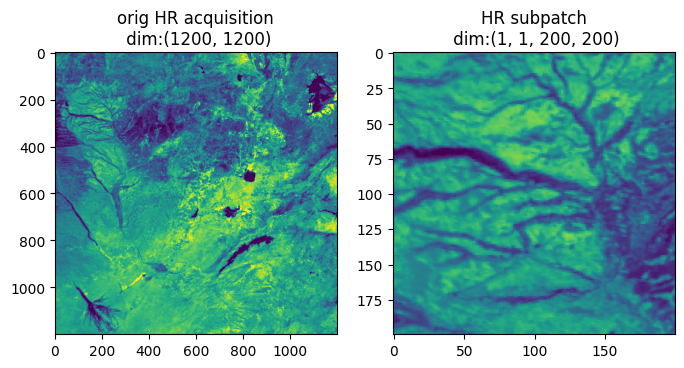

In [ ]:
# Load MODIS dataset
filename = "MOD11A1.A2020222.h20v10.061.2021013204929.hdf"

# HR image reading and rescaling values by sf=0.02 (in K)
data = SD(os.path.join(filename), SDC.READ)
data = data.select("LST_Day_1km")[:,:].astype(np.float64)
data = torch.Tensor(data*0.02)

# Imputing zerofilled
print("percentage of zero-filled:", torch.where(data==0, 1, 0).float().mean().item())
data = torch.where(data==0, data[data!=0].mean(), data)

# Rescaling dividing by max value --> [0,1]
print("data range (K)    {min, max}: ", data.min().item(), data.max().item())
dmin, dmax = data.min().item(), data.max().item()
data = data / dmax
print("data range (norm) {min, max}: ", data.min().item(), data.max().item())

# Collect mean and std to clip histogram plotting
datamean, datastd = data.mean().item(), data.std().item()
print("data params   {mean, std}:", datamean, datastd)

# Upper and lower value limits for visualisation purposes
llim, ulim = datamean - 2.5*datastd, datamean + 2.5*datastd
print("data lower and upper value lim:", llim, ulim)

# Subpatch extraction
hlim, wlim = (200,400), (100,300)
hr = data[hlim[0]:hlim[1], wlim[0]:wlim[1]]
hr = hr.reshape(1, 1, hr.shape[-2], hr.shape[-1])

# Plot
titles = ("orig HR acquisition", "HR subpatch")
toplot = (data, hr)
_, axs = plt.subplots(1, len(toplot), figsize=(8,8))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"),
                  vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

### Rescaling
Pretext original image degradation via bicubic interpolation according to a given `scale_factor`

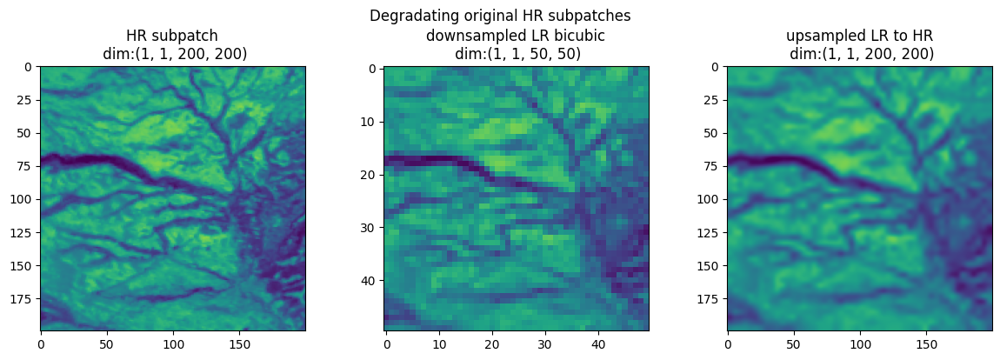

In [ ]:
scale_factor = 4

# Interpolate
child = F.interpolate(hr, scale_factor=1/scale_factor, mode="bicubic", antialias=True)
child_up = F.interpolate(child, scale_factor=scale_factor, mode="bicubic", antialias=True)

# To DEVICE
hr = hr.to(DEVICE)
child = child.to(DEVICE)
child_up = child_up.to(DEVICE)

# Plot
titles = ["HR subpatch", "downsampled LR bicubic", "upsampled LR to HR"]
subpatches = [hr, child, child_up]
plotsubpatch(subpatches, titles, llim, ulim)

### Model initialization

In [ ]:
nchannels = 1

# Model initialisation
#model = build_unet(nchannels=nchannels).to(DEVICE)
#model = ZSSRNet(input_channels=nchannels, kernel_size=3, channels=128).to(DEVICE)
#model = build_resunet(nchannels=nchannels).to(DEVICE)
#model = build_haunet(scale_factor, nchannels=nchannels, multi_image=False).to(DEVICE)
model = MRUNet(n_channels=nchannels, n_resblocks=1).to(DEVICE)

# Training specs
loss_function = torch.nn.L1Loss()
optimizer     = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
            factor=0.1, patience=10, threshold=1e-08, threshold_mode='abs')

def adjust_learning_rate(optimizer, new_lr):
    """Manually adjusting lr for a given optimizer
    """
    for param_group in optimizer.param_groups:
        param_group['lr'] = new_lr

### Training Loop

100%|██████████| 2000/2000 [04:23<00:00,  7.60it/s, Loss «0.001144404»  Delta Loss «-0.000944689»  Delta PSNR «1.740524292»  Delta SSIM «0.261890173»] 



 SR-HR:  PSNR (101.041756)  Loss (0.0011444041)
 LR-HR:  PSNR (99.301231)  Loss (0.0020890932)


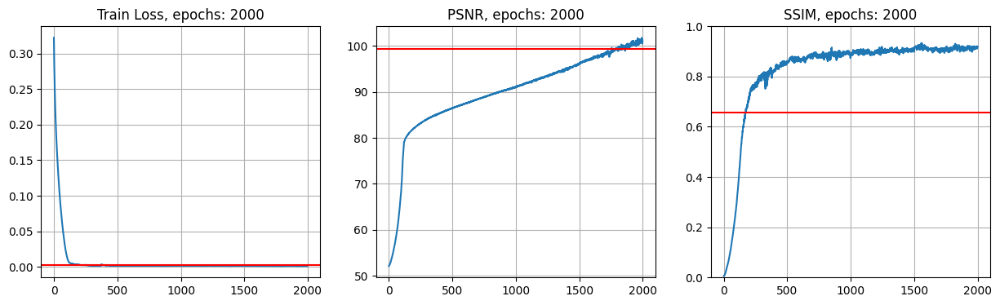

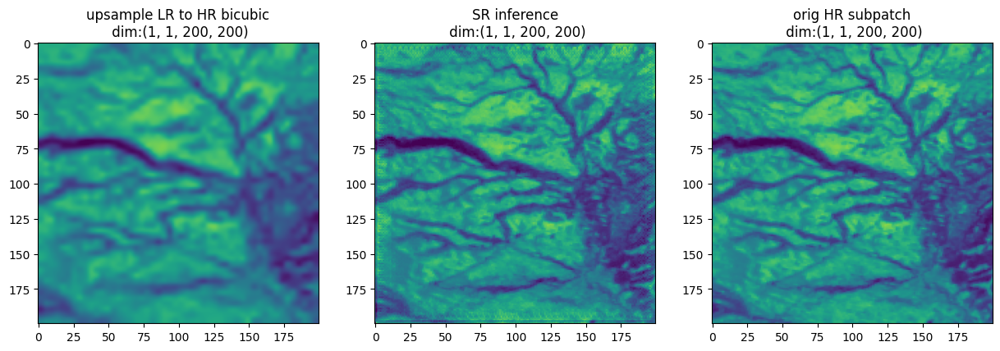

In [ ]:
# Training params
nepochs = 2000
adjust_learning_rate(optimizer, new_lr=1e-05)

# Training loop
model.train()
cache = np.zeros((nepochs, 3))

gt_loss = loss_function(child_up, hr)
gt_psnr = psnr(child_up, hr)
gt_ssim = ssim(child_up, hr)

progression_bar = tqdm(range(nepochs), total=nepochs)
for e in progression_bar:
    output = model(child_up).to(DEVICE)
    loss = loss_function(output, hr)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    #scheduler.step(loss.item())

    # Performance metrics
    cache[e, 0] = loss.item()
    cache[e, 1] = psnr(output, hr)
    cache[e, 2] = ssim(output, hr)
    dloss = loss.item() - gt_loss
    dpsnr = psnr(output, hr) - gt_psnr
    dssim = ssim(output, hr) - gt_ssim
    progression_bar.set_postfix_str(f"Loss «{(loss.item()):.9f}»  Delta Loss «{(dloss):.9f}»  Delta PSNR «{(dpsnr):.9f}»  Delta SSIM «{(dssim):.9f}»")

# Inference Eval
print(f"\n SR-HR:  PSNR ({psnr(output, hr):.6f})  Loss ({loss_function(output, hr):.10f})")
print(f" LR-HR:  PSNR ({psnr(child_up, hr):.6f})  Loss ({loss_function(child_up, hr):.10f})")

# Plot training curves
titles = ["Train Loss", "PSNR", "SSIM"]
_, axs = plt.subplots(1, 3, figsize=(15,4))
axs[0].plot(cache[:,0]); axs[0].axhline(gt_loss.item(), c="red"); axs[0].set_title(f"{titles[0]}, epochs: {nepochs}");  axs[0].grid()
axs[1].plot(cache[:,1]); axs[1].axhline(gt_psnr, c="red"); axs[1].set_title(f"{titles[1]}, epochs: {nepochs}");  axs[1].grid()
axs[2].plot(cache[:,2]); axs[2].axhline(gt_ssim, c="red"); axs[2].set_title(f"{titles[2]}, epochs: {nepochs}"); axs[2].set_ylim((0,1));  axs[2].grid()


# Plot results
titles = ["upsample LR to HR bicubic", "SR inference", "orig HR subpatch"]
toplot = (child_up, output, hr)
_, axs = plt.subplots(1,len(toplot),figsize=(15,6))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"),
                vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

### Now testing zeroshot upscaling
Original HR upsampling according to `scale_factor` and bicubic interpolation.

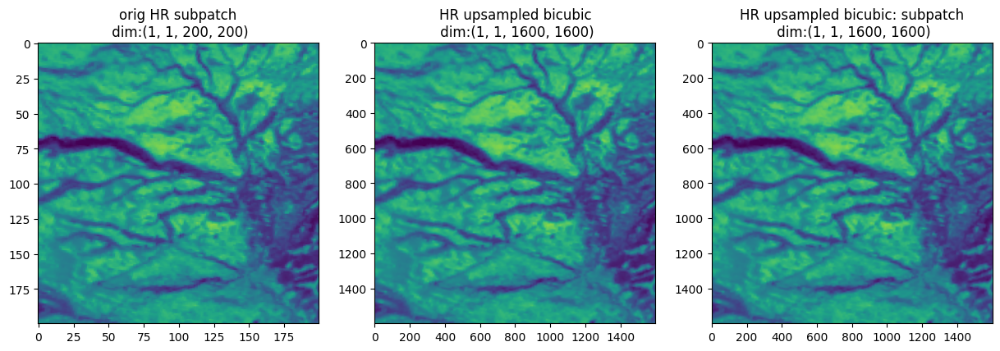

In [ ]:
# Trying zeroshot scale factor
new_scale_factor = scale_factor
new_scale_factor = 8

hr_up = F.interpolate(hr, scale_factor=new_scale_factor, mode="bicubic", antialias=True)
hr_up = hr_up.to(DEVICE)

# Subpatch selection
patch_size = (1600,1600)
hr_up_subpatch = tt.Compose([tt.RandomCrop(patch_size)])(hr_up)

# Plot
titles = ["orig HR subpatch", "HR upsampled bicubic", "HR upsampled bicubic: subpatch"]
toplot = (hr, hr_up, hr_up_subpatch)
_, axs = plt.subplots(1,len(toplot),figsize=(15,6))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"),
                  vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

Self-supervised trained inference estimation.

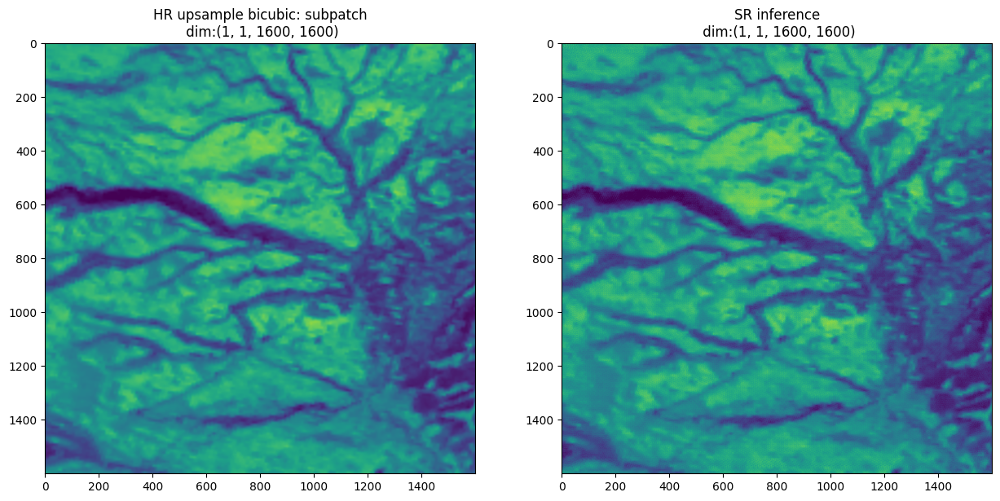

In [ ]:
# Evaluating over the new upscaled version
model.eval()
with torch.no_grad():
    inference = model(hr_up_subpatch).to(DEVICE)


# Plot
titles = ["HR upsample bicubic: subpatch", "SR inference"]
toplot = (hr_up_subpatch, inference)
_, axs = plt.subplots(1,len(toplot),figsize=(15,8))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"),
                  vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

### Residual mapping

Avg bias: 5.510284609044902e-06
Max pos-neg bias: 0.019290268421173096 -0.012810826301574707


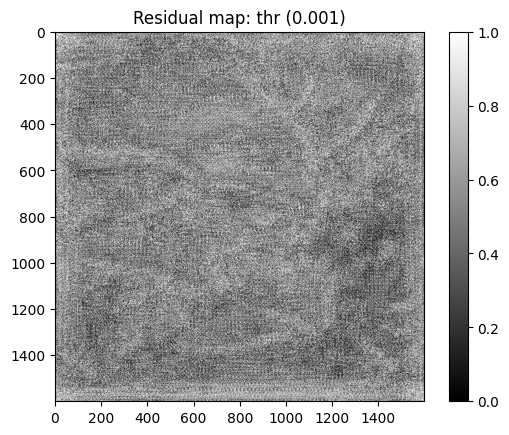

In [ ]:
thr = 0.001
diff = inference.detach().to("cpu").squeeze() - hr_up_subpatch.detach().to("cpu").squeeze()
print("Avg bias:", diff.float().mean().item())
print("Max pos-neg bias:", diff.max().item(), diff.min().item())

diff = torch.where(torch.abs(diff)>thr, 1, 0)
plt.imshow(diff, cmap="gray")
plt.title(f"Residual map: thr ({thr})")
plt.colorbar()
plt.show()

---

# Batch based Training + Inference

Simple optimization procedure allowing to learn a SR function given a fixed `scale_factor` over a `batch_size` amount of elements.

**Goal**:<br/>
The purpose of the following attempt is to prove that SR over newly unseen subpatches can be successfully performed by a function that had been trained to minimise the objective reconstruction loss over a limited amount of spatial acquisition. In other terms, we are addressing whether training a SR architecture over a limited amount of HR image subpatches will be sufficient to further perform SR over previously unseen tiles.

**Procedure**:
- Split the original HR image into subpatches according to a given `tiles_size`.
- Select a limited amount of subpatches to be used as training data (20% to 25%) at random.
- Leave out the remaining tiles and iteratively evaluate the performance of the reconstructed SR images over the training procedure.
- Address whether the SR function has been learned properly in order to further test over arbitrarily upscaled images (Zero-shot).

In [16]:
# Utils functions
def read_rescale(filename, layername):
    """Read HDF file and rescale by Scale Factor
    """
    data = SD(os.path.join(filename), SDC.READ)
    data = data.select(layername)[:,:].astype(np.float64)
    return torch.Tensor(data * SF)

def preprocess_data(data):
    """Impute missing (zero.filled) and rescale to [0,1]
    """
    data = torch.where(data==0, data[data!=0].mean(), data)
    data = data / data.max()
    return data

def get_low_up_lim(data, nstd=2.5):
    """ Lower and upper limit for visualization purposes
    """
    datamean, datastd = data.mean().item(), data.std().item()
    return  datamean - nstd*datastd, datamean + nstd*datastd

def draw_tiles_coords(tile_size, h, w):
    """ Return list of subtiles coords boundaries
    """
    # h and w sub-tiles coords
    tiles_h = [(i, i+tile_size) for i in range(0, h, tile_size)]
    tiles_w = [(i, i+tile_size) for i in range(0, w, tile_size)]
    # Draw sub-tiles from
    subtiles_coords = []
    for _i, coord_h in enumerate(tiles_h):
        for _j, coord_w in enumerate(tiles_w):
            subtiles_coords.append((coord_w[0], coord_w[1], coord_h[0], coord_h[1]))
    return subtiles_coords

def train_test_split(data, ntrain, subtiles_coords):
    """ Return train and test split tensors (at random) by passing the amount
    of items in each set.
    """
    ntot = len(subtiles_coords)
    subpatches = [data[y0:y1, x0:x1].unsqueeze(0).unsqueeze(0) \
        for i, (y0, y1, x0, x1) in enumerate(subtiles_coords)]
    np.random.shuffle(subpatches)
    train_data = torch.cat(subpatches[0:ntrain], 0)
    test_data  = torch.cat(subpatches[ntrain:ntot], 0)
    return train_data, test_data

def get_lr(hr, scale_factor):
    """ Return pre-upsample LR images from HR (bicubic interpolation)
    """
    child    = F.interpolate(hr, scale_factor=1/scale_factor, mode="bicubic", antialias=True)
    child_up = F.interpolate(child, scale_factor=scale_factor, mode="bicubic", antialias=True)
    return child_up

def adjust_learning_rate(optimizer, new_lr):
    """ Manually adjusting lr for a given optimizer
    """
    for param_group in optimizer.param_groups:
        param_group['lr'] = new_lr

def ssim(lr, hr): #### re-implement
    """ Custom SSIM implementation
    """
    lr = lr.squeeze().cpu().detach().numpy()
    hr = hr.squeeze().cpu().detach().numpy()
    return ssim_sk(lr, hr, data_range=hr.max()-hr.min(), channel_axis=0)

def psnr_overbatch(lr, hr):
    """ Return the distribution of SSIM estimated over batch 0-th dim images
    dim(lr) = dim(hr) = (B, 1, H, W) (pre-upsample)
    """
    # !!! Suboptimal implementation !!!
    nitems = lr.shape[0]
    result = torch.Tensor([psnr(lr[i,:,:,:], hr[i,:,:,:]) for i in range(nitems)])
    return result.mean().item(), result.std().item()

def ssim_overbatch(lr, hr):
    """ Return the distribution of SSIM estimated over batch 0-th dim images
    dim(lr) = dim(hr) = (B, 1, H, W) (pre-upsample)
    """
    # !!! Suboptimal implementation !!!
    nitems = lr.shape[0]
    result = torch.Tensor([ssim(lr[i,:,:,:], hr[i,:,:,:]) for i in range(nitems)])
    return result.mean().item(), result.std().item()

def get_performance_metrics(lr, hr):
    """ dim(lr)=dim(hr)=(B, C, H, W)
    """
    psnr_m, psnt_s = psnr_overbatch(lr, hr)
    ssim_m, ssim_s = ssim_overbatch(lr, hr)
    return psnr_m, psnt_s, ssim_m, ssim_s

def get_bias_maps(inference, hr, thr=0.001):
    """ Return thresholded binary maps
    """
    diff  = torch.subtract(inference.detach().to("cpu"), hr.detach().to("cpu"))
    maps  = torch.where(diff>thr, 1, 0) + torch.where(diff<-thr, 1, 0)
    bdiff = torch.where(torch.abs(diff)>thr, 1, 0)
    return diff, maps, bdiff

def plotsubpatch(subpatches, titles, suptitle, llim, ulim, cmap=None):
    """ General utils plot function """
    try: n = toplot.shape[0]
    except: n = len(subpatches)
    _, axs = plt.subplots(1, n, figsize=(12,4))
    for i,item in enumerate(subpatches):
        if cmap == None:
            axs[i].imshow(item.squeeze().detach().to("cpu"), vmin = llim, vmax = ulim)
        else:
            axs[i].imshow(item.squeeze().detach().to("cpu"), cmap=cmap, vmin = llim, vmax = ulim)
        axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
    if suptitle != None:
        plt.suptitle(suptitle)
    plt.tight_layout()
    plt.show()

def plot_vars():
    # Plot training curves (over Train subpatches)
    titles = ["Train Loss", "PSNR", "SSIM"]
    _, axs = plt.subplots(1, 3, figsize=(12,4))
    axs[0].plot(cache[:,0])
    axs[0].axhline(traingt_loss, c="red");
    axs[0].set_title(f"{titles[0]}, epochs: {nepochs}"); axs[0].grid()

    axs[1].plot(cache[:,1])
    axs[1].fill_between(np.arange(0, nepochs),
                        traingt_psnr_m-traingt_psnr_s, traingt_psnr_m+traingt_psnr_s,
                        alpha=0.2, color="red")
    axs[1].axhline(traingt_psnr_m, c="red");
    axs[1].set_title(f"{titles[1]}, epochs: {nepochs}"); axs[1].grid()

    axs[2].plot(cache[:,2])
    axs[2].fill_between(np.arange(0, nepochs),
                        traingt_ssim_m-traingt_ssim_s, traingt_ssim_m+traingt_ssim_s,
                        alpha=0.2, color="red")
    axs[2].axhline(traingt_ssim_m, c="red")
    axs[2].set_title(f"{titles[2]}, epochs: {nepochs}"); axs[2].grid()
    plt.tight_layout(); plt.show()

    # Plot training curves (over Test subpatches)
    titles = ["Test Loss", "PSNR", "SSIM"]
    _, axs = plt.subplots(1, 3, figsize=(12,4))
    axs[0].plot(cache[:,3])
    axs[0].axhline(testgt_loss, c="red");
    axs[0].set_title(f"{titles[0]}, epochs: {nepochs}"); axs[0].grid()

    axs[1].plot(cache[:,4])
    axs[1].fill_between(np.arange(0, nepochs),
                        testgt_psnr_m-testgt_psnr_s, testgt_psnr_m+testgt_psnr_s,
                        alpha=0.2, color="red")
    axs[1].axhline(testgt_psnr_m, c="red");
    axs[1].set_title(f"{titles[1]}, epochs: {nepochs}"); axs[1].grid()

    axs[2].plot(cache[:,5])
    axs[2].fill_between(np.arange(0, nepochs),
                        testgt_ssim_m-testgt_ssim_s, testgt_ssim_m+testgt_ssim_s,
                        alpha=0.2, color="red")
    axs[2].axhline(testgt_ssim_m, c="red")
    axs[2].set_title(f"{titles[2]}, epochs: {nepochs}"); axs[2].grid()
    plt.tight_layout(); plt.show()

Subpatch coordinates extraction.

### LR generation from HR subpatches

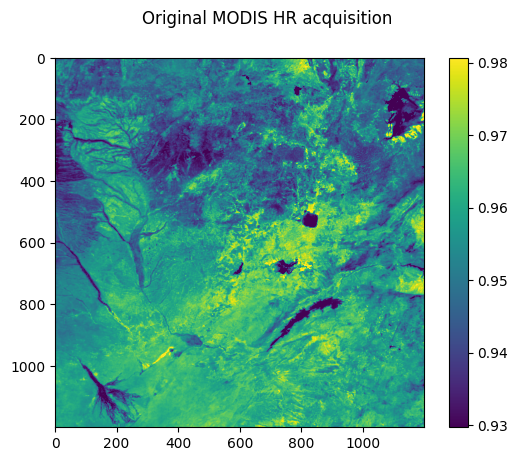

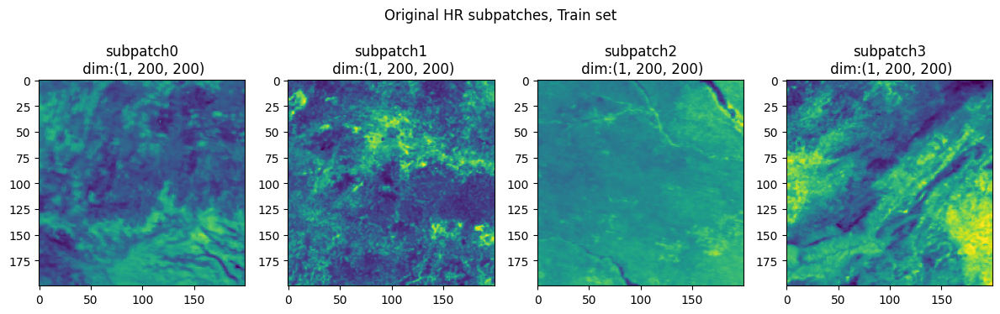

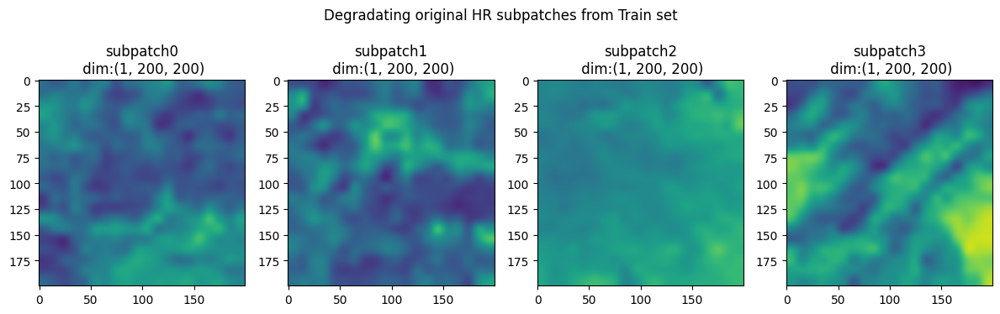

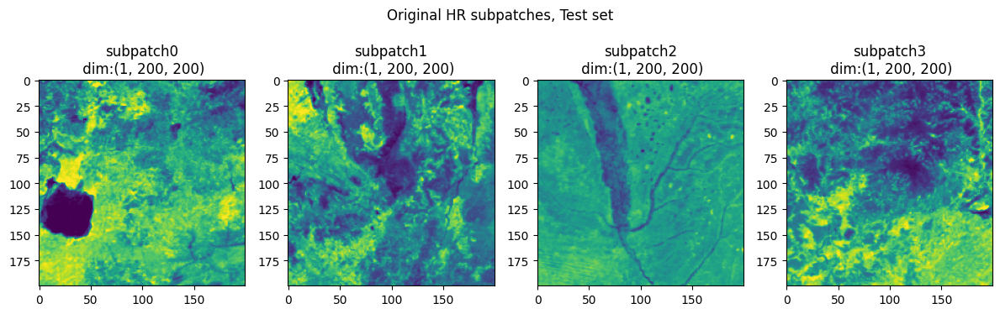

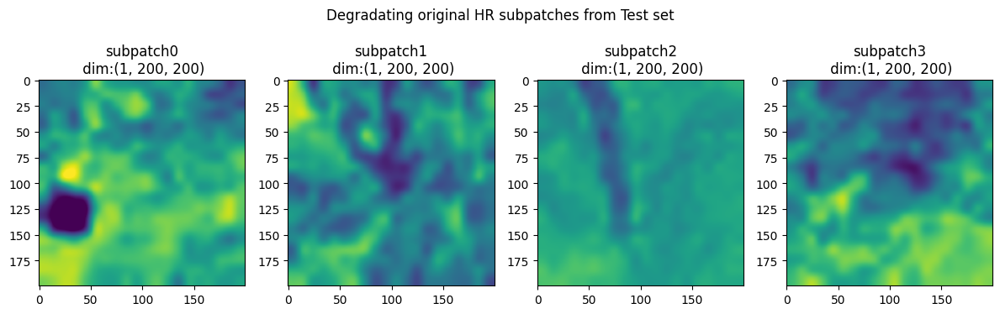

In [51]:
# Load MODIS dataset
filename  = "MOD11A1.A2020222.h20v10.061.2021013204929.hdf"
layername = "LST_Day_1km"
SF        = 0.02  # MODIS scale factor
tile_size      = 200   # dimension of each square subpatch
nitems_train   = 16    # amount of subpatches to be used as train set
batch_size     = 16    # batch dimension
nimage_to_plot = 4     # amount of subpatches to be plotted

# Read data
data = read_rescale(filename, layername)
data = preprocess_data(data)

# Upper and lower value limits for visualisation purposes
llim, ulim = get_low_up_lim(data, nstd=2.5)

# Collect train, test subpatches
h, w = data.shape
subtiles_coords = draw_tiles_coords(tile_size, h, w)
hr_train, hr_test = train_test_split(data, nitems_train, subtiles_coords)

# to speed up: reducing hr_test size == batch_size
hr_test = hr_test[0:8, :, :, :]

# Get LR counterpart by bicubic interpolation (pre-upsampling)
UP_SCALE = 10
child_up_train = get_lr(hr_train, scale_factor=UP_SCALE)
child_up_test  = get_lr(hr_test, scale_factor=UP_SCALE)

# Plot original image
plt.imshow(data, vmin = llim, vmax = ulim)
plt.suptitle("Original MODIS HR acquisition")
plt.colorbar()
plt.show()

# Plot HR subpatches (Train set)
plotsubpatch(subpatches = hr_train[0:nimage_to_plot],
             titles = [f"subpatch{i}" for i in range(nimage_to_plot)],
             suptitle = "Original HR subpatches, Train set",
             llim=llim, ulim=ulim)

# Plot LR subpatches (Train set)
plotsubpatch(subpatches = child_up_train[0:nimage_to_plot],
            titles = [f"subpatch{i}" for i in range(nimage_to_plot)],
            suptitle = "Degradating original HR subpatches from Train set",
            llim=llim, ulim=ulim)

# Plot HR subpatches (Train set)
plotsubpatch(subpatches = hr_test[0:nimage_to_plot],
             titles = [f"subpatch{i}" for i in range(nimage_to_plot)],
             suptitle = "Original HR subpatches, Test set",
             llim=llim, ulim=ulim)

# Plot LR subpatches (Train set)
plotsubpatch(subpatches = child_up_test[0:nimage_to_plot],
            titles = [f"subpatch{i}" for i in range(nimage_to_plot)],
            suptitle = "Degradating original HR subpatches from Test set",
            llim=llim, ulim=ulim)

### Model initialization

In [52]:
nchannels = 1

# Model initialisation
model = MRUNet(n_channels=nchannels, n_resblocks=2).to(DEVICE)

# Training specs
loss_function = torch.nn.L1Loss()
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0001, weight_decay=0)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
            factor=0.1, patience=10, threshold=10e-7, threshold_mode='abs')

### Training Loop

100%|██████████| 500/500 [06:39<00:00,  1.25it/s, Loss «0.00353555»  D-Loss «0.00084235»  D-PSNR «-7.56897736»  D-SSIM «0.05602968»]



 LR-HR:  PSNR (96.401031)  Loss (0.0026932070)
 SR-HR:  PSNR (89.504921)  Loss (0.0035355545)


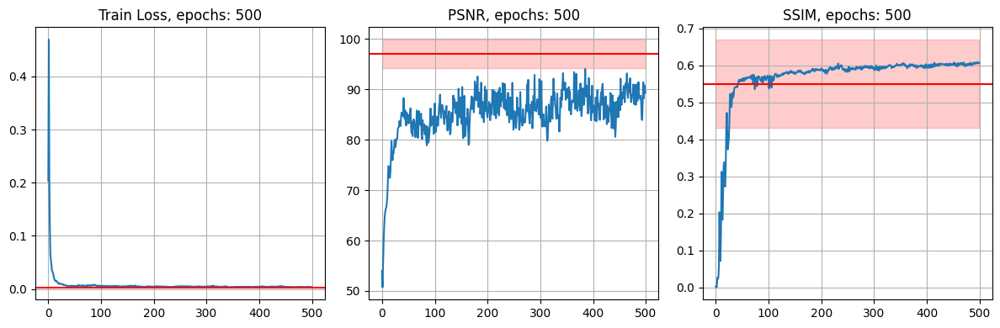

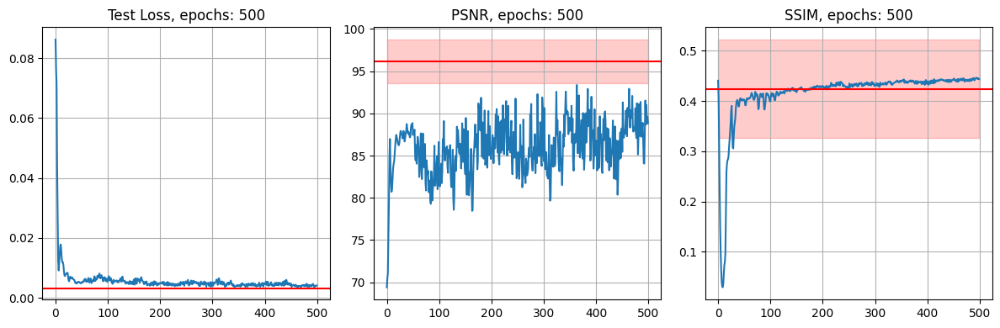

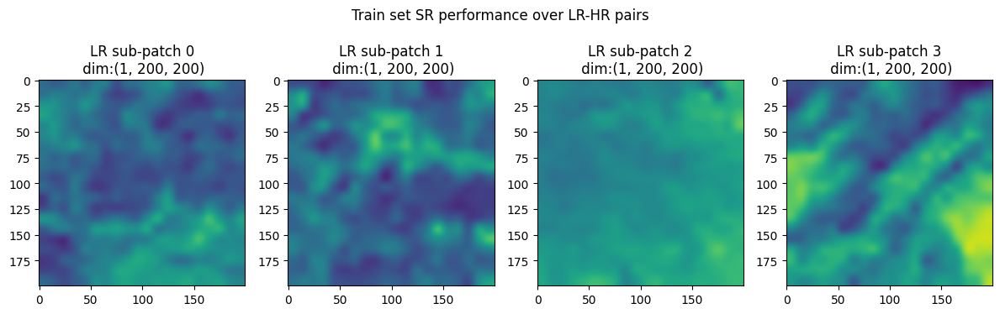

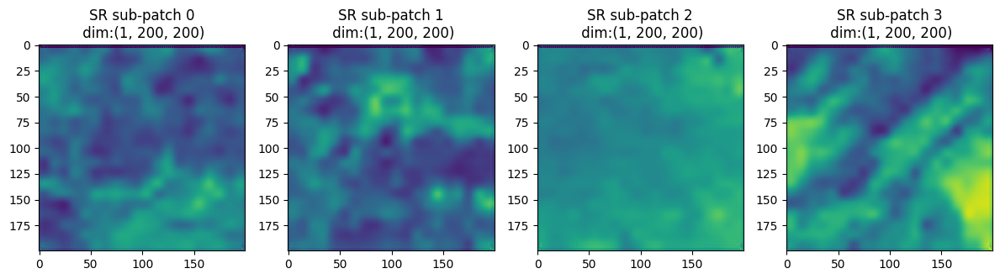

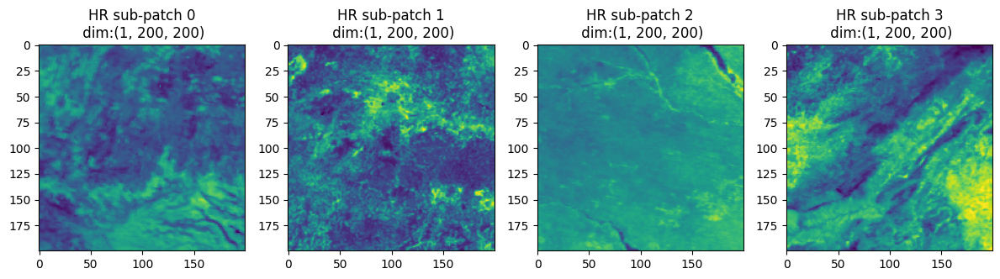

In [53]:
hr_train = hr_train.to(DEVICE)
hr_test  = hr_test.to(DEVICE)
child_up_train = child_up_train.to(DEVICE)
child_up_test  = child_up_test.to(DEVICE)

# Collect Ground Truth reconstruction metrics (LR - HR)
traingt_loss = loss_function(child_up_train, hr_train).item()
testgt_loss = loss_function(child_up_test, hr_test).item()

traingt_psnr_m, traingt_psnr_s, traingt_ssim_m, traingt_ssim_s = get_performance_metrics(child_up_train, hr_train)
testgt_psnr_m, testgt_psnr_s, testgt_ssim_m, testgt_ssim_s = get_performance_metrics(child_up_test, hr_test)

# Training params
nepochs = 500
adjust_learning_rate(optimizer, new_lr=10e-4)

cache = np.zeros((nepochs, 6))

# Without splitting into batch
progression_bar = tqdm(range(nepochs), total=nepochs)
for e in progression_bar:

    # Train subpatches
    model.train()
    output_train = model(child_up_train).to(DEVICE)
    loss = loss_function(output_train, hr_train)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()#; scheduler.step(loss.item())

    # Performance metrics
    psnr_m = psnr(output_train, hr_train)
    ssim_m = ssim(output_train, hr_train)
    #psnr_m, psnt_s = psnr_overbatch(output_train, hr_train)
    #ssim_m, ssim_s = ssim_overbatch(output_train, hr_train)
    store_train = [loss.item(), psnr_m, ssim_m]

    # Delta performance
    dloss = loss.item() - traingt_loss
    dpsnr = psnr_m - traingt_psnr_m
    dssim = ssim_m - traingt_ssim_m
    progression_bar.set_postfix_str(f"Loss «{(loss.item()):.8f}»  D-Loss «{(dloss):.8f}»  D-PSNR «{(dpsnr):.8f}»  D-SSIM «{(dssim):.8f}»")

    # Test subpatches
    model.eval()
    with torch.no_grad():
        output_test = model(child_up_test).to(DEVICE)
        loss = loss_function(output_test, hr_test)

        # Performance metrics
        psnr_m = psnr(output_test, hr_test)
        ssim_m = ssim(output_test, hr_test)
        #psnr_m, psnt_s = psnr_overbatch(output_test, hr_test)
        #ssim_m, ssim_s = ssim_overbatch(output_test, hr_test)
        store_test = [loss.item(), psnr_m, ssim_m]

    # Store performance metrics
    cache[e,:] = store_train + store_test

# Inference Eval
print(f"\n LR-HR:  PSNR ({psnr(child_up_train, hr_train):.6f})  Loss ({loss_function(child_up_train, hr_train):.10f})")
print(f" SR-HR:  PSNR ({psnr(output_train, hr_train):.6f})  Loss ({loss_function(output_train, hr_train):.10f})")

# Plot
plot_vars()

plotsubpatch(subpatches = child_up_train[0:nimage_to_plot],
         titles = [f"LR sub-patch {i}" for i in range(batch_size)],
         suptitle = "Train set SR performance over LR-HR pairs", llim=llim, ulim=ulim)
plotsubpatch(subpatches = output_train[0:nimage_to_plot],
         titles = [f"SR sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)
plotsubpatch(subpatches = hr_train[0:nimage_to_plot],
         titles = [f"HR sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)

### Evaluating SR performance over Test set
Testing whether the currently trained model is able to generalize the learned SR mapping over subpatches which it has not been explicitly trained on (preserving original Scale Factor SR and input size).

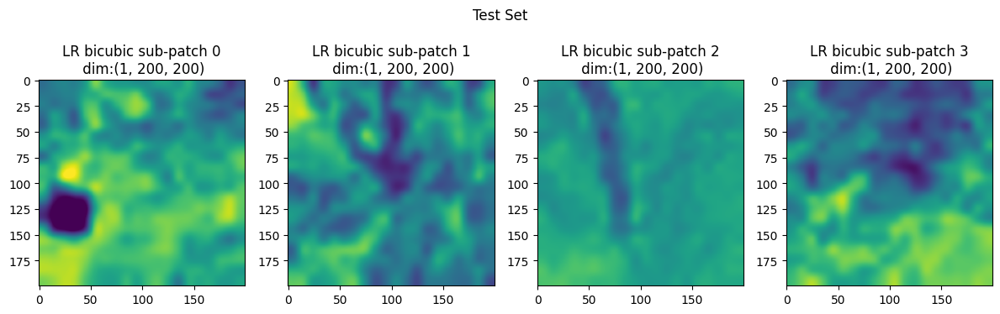

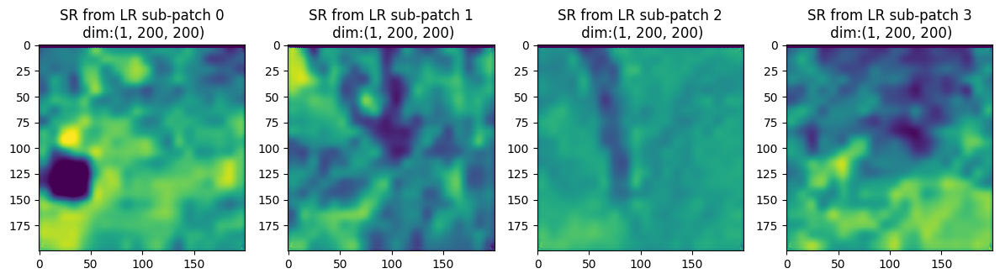

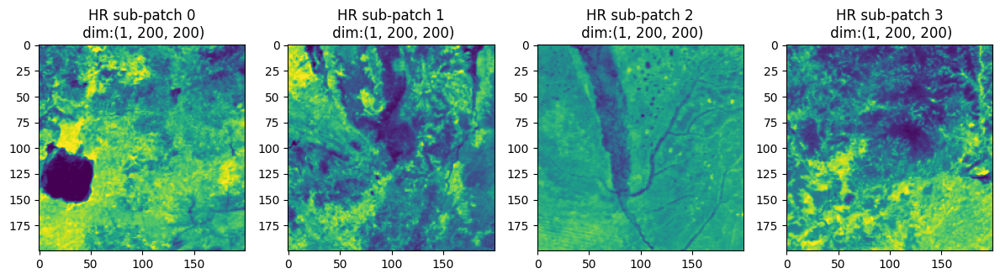

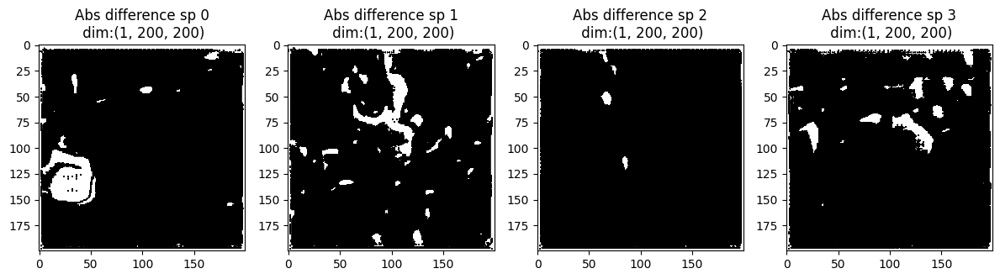

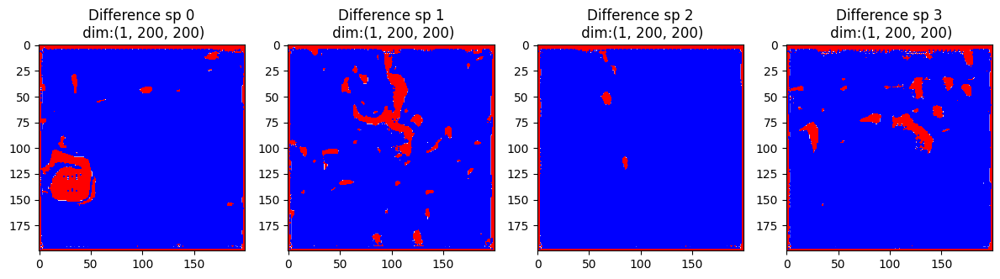

In [81]:
model.eval()
with torch.no_grad():
    inference = model(child_up_test)

# Bias map for visualisation
diff, maps, bdiff = get_bias_maps(inference, child_up_test, thr=0.001)

# Plot original HR subpatc
plotsubpatch(subpatches = child_up_test[0:nimage_to_plot],
         titles = [f"LR bicubic sub-patch {i}" for i in range(batch_size)],
         suptitle = "Test Set", llim=llim, ulim=ulim)

# Plot SR from LR
plotsubpatch(subpatches = inference[0:nimage_to_plot],
         titles = [f"SR from LR sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)

# Plot HR
plotsubpatch(subpatches = hr_test[0:nimage_to_plot],
         titles = [f"HR sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)

# Plot abs difference map
plotsubpatch(subpatches = bdiff[0:nimage_to_plot],
        titles = [f"Abs difference sp {i}" for i in range(batch_size)],
        suptitle = None, llim=llim, ulim=ulim, cmap = "gray")

# Plot difference map
plotsubpatch(subpatches = maps[0:nimage_to_plot],
        titles = [f"Difference sp {i}" for i in range(batch_size)],
        suptitle = None, llim=llim, ulim=ulim, cmap = "bwr")


### Testing zeroshot performance over original HR subpatches (Train Set)

Zero-shot visual assessment performance over original HR subatpches (from _Train_ Set) upsampled  according to the same scale factor as it was learned from the previous self-supervised procedure in order to yield $800\times800$ image size (from $200\times200$).


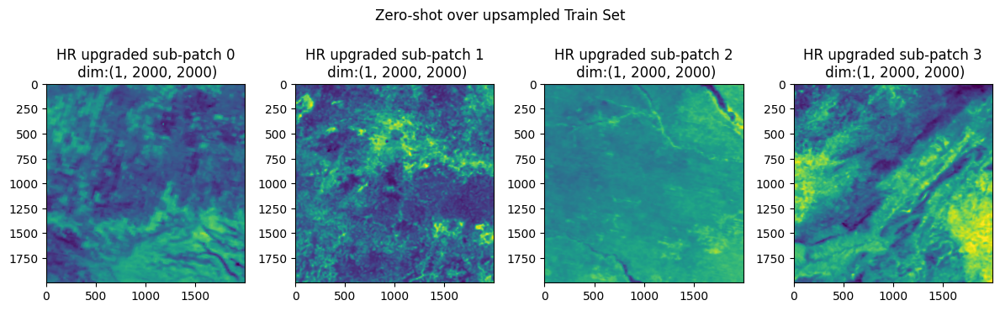

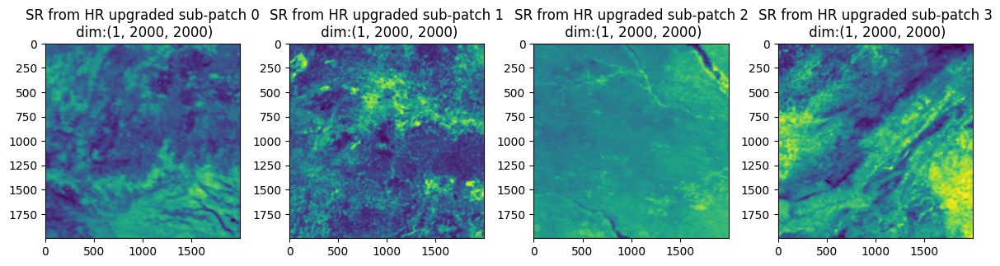

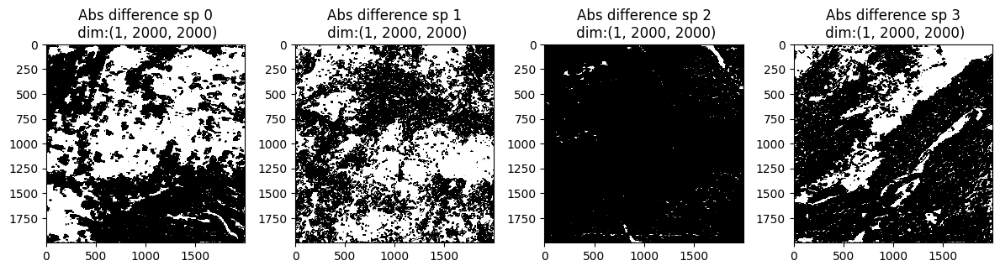

In [80]:
# Selecting the current set (train, test)
current_set = hr_train

nimage_to_plot = 4

# Upscaling original HR images to x scale_factor
hr_up = F.interpolate(current_set, scale_factor=UP_SCALE, mode="bicubic", antialias=True)
hr_up = hr_up.to(DEVICE)

# Subpatch selection
patch_size = (tile_size * UP_SCALE, tile_size * UP_SCALE)
hr_up_subpatch = tt.Compose([tt.RandomCrop(patch_size)])(hr_up).to(DEVICE)

model.eval()
with torch.no_grad():
     inference = torch.cat(
         [model(hr_up_subpatch[i,:,:,:].unsqueeze(0)).to(DEVICE) \
          for i in range(hr_up_subpatch.shape[0])],
         0)

# Bias map for visualisation
diff, maps, bdiff = get_bias_maps(inference, hr_up_subpatch, thr=0.001)

# Plot HR upgraded via bicubic
plotsubpatch(subpatches = hr_up_subpatch[0:nimage_to_plot],
         titles = [f"HR upgraded sub-patch {i}" for i in range(batch_size)],
         suptitle = "Zero-shot over upsampled Train Set", llim=llim, ulim=ulim)

# Plot SR from HR
plotsubpatch(subpatches = inference[0:nimage_to_plot],
         titles = [f"SR from HR upgraded sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)

# Plot abs difference map
plotsubpatch(subpatches = torch.where(
        torch.abs(inference[0:nimage_to_plot] - hr_up_subpatch[0:nimage_to_plot])> 0.0001, 1, 0),
        titles = [f"Abs difference sp {i}" for i in range(batch_size)],
        suptitle = None, llim=llim, ulim=ulim, cmap = "gray")

### Testing zeroshot performance over new HR subpatches (Test Set)

Zero-shot visual assessment performance over original HR subatpches (from _Test_ Set) upsampled  according to the same scale factor as it was learned from the previous self-supervised procedure in order to yield $800\times800$ image size (from $200\times200$).

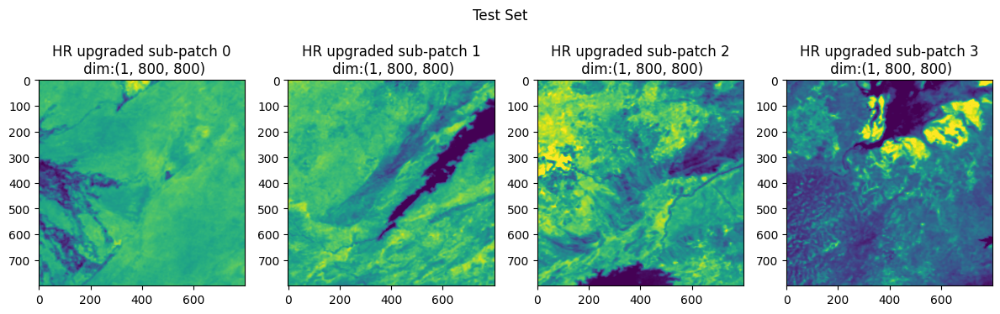

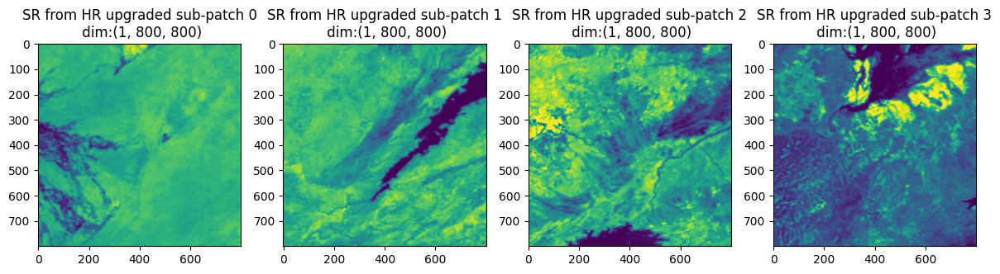

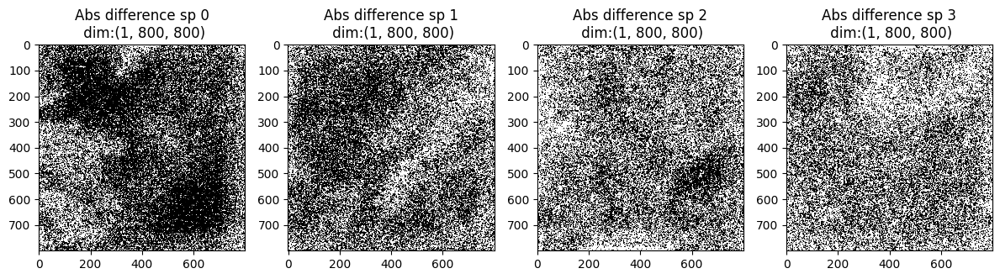

In [ ]:
current_set = hr_test

# Upscaling HR test to target dimension (x ScaleFactor)
hr_up = F.interpolate(current_set, scale_factor=UP_SCALE, mode="bicubic", antialias=True)
hr_up = hr_up.to(DEVICE)

# Subpatch selection
patch_size = (tile_size * UP_SCALE, tile_size * UP_SCALE)
hr_up_subpatch = tt.Compose([tt.RandomCrop(patch_size)])(hr_up).to(DEVICE)

model.eval()
with torch.no_grad():
    inference = torch.cat(
         [model(hr_up_subpatch[i,:,:,:].unsqueeze(0)).to(DEVICE) \
          for i in range(hr_up_subpatch.shape[0])],
         0)
    #inference = model(hr_up_subpatch).to(DEVICE)

# Bias map for visualisation
diff, maps, bdiff = get_bias_maps(inference, hr_up_subpatch, thr=0.001)

# Plot HR upgraded via bicubic
plotsubpatch(subpatches = hr_up_subpatch[0:nimage_to_plot],
         titles = [f"HR upgraded sub-patch {i}" for i in range(batch_size)],
         suptitle = "Test Set", llim=llim, ulim=ulim)

# Plot SR from HR
plotsubpatch(subpatches = inference[0:nimage_to_plot],
         titles = [f"SR from HR upgraded sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)

# Plot abs difference map
plotsubpatch(subpatches = bdiff[0:nimage_to_plot],
        titles = [f"Abs difference sp {i}" for i in range(batch_size)],
        suptitle = None, llim=llim, ulim=ulim, cmap = "gray")

# Plot difference map
plotsubpatch(subpatches = maps[0:nimage_to_plot],
        titles = [f"Abs difference sp {i}" for i in range(batch_size)],
        suptitle = None, llim=llim, ulim=ulim, cmap = "bwr")

Now testing a smaller size subpatch extracted from the

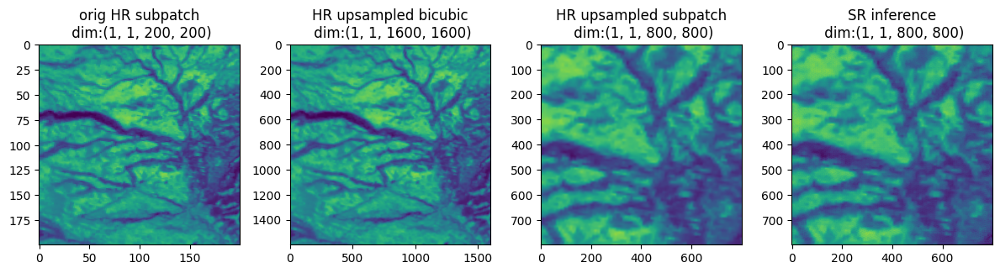

In [ ]:
# Subpatch extraction
hlim, wlim = (200,400), (100,300)
hr = data[hlim[0]:hlim[1], wlim[0]:wlim[1]]
hr = hr.reshape(1, 1, hr.shape[-2], hr.shape[-1])
hr_up = F.interpolate(hr, scale_factor=8, mode="bicubic", antialias=True).to(DEVICE)

# Subpatch selection
patch_size = (800,800)
hr_up_subpatch = tt.Compose([tt.RandomCrop(patch_size)])(hr_up)

# Tesing given a single large image
model.eval()
with torch.no_grad():
    inference = model(hr_up_subpatch).to(DEVICE)

# Plot
plotsubpatch(subpatches = (hr, hr_up, hr_up_subpatch, inference),
         titles =  ["orig HR subpatch", "HR upsampled bicubic", "HR upsampled subpatch", "SR inference"],
         suptitle = None, llim=llim, ulim=ulim)

### Residual mapping

Avg bias: -7.892352005001158e-05
Max pos-neg bias: 0.029219388961791992 -0.04318046569824219


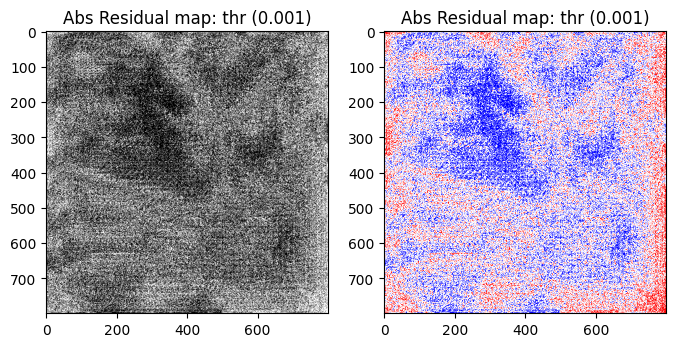

In [ ]:
thr = 0.001

from matplotlib import colormaps

diff, maps, bdiff = get_bias_maps(inference, hr_up_subpatch)

print("Avg bias:", diff.float().mean().item())
print("Max pos-neg bias:", diff.max().item(), diff.min().item())

_,axs = plt.subplots(1,2, figsize=(8,4))
axs[0].imshow(bdiff, cmap="gray"); axs[0].set_title(f"Abs Residual map: thr ({thr})")
axs[1].imshow(maps, cmap="bwr"); axs[1].set_title(f"Abs Residual map: thr ({thr})"); axs[1]

plt.show()


### Inference
Adressing the performance metrics over the residual amounts of subpathces. Test can be done by either:
1. exclusively evaluating the remaining subpatches (those that were excluded from the self-supervised approach), and
2. by estimating SR over the whole image.

In [ ]:
total_subtiles = len(subtiles_coords["tiles_n"])

# Drawing Test subpatches
batch_size = 8
test_data = []
for i in range(batch_size, total_subtiles):
    y0,y1,x0,x1 = subtiles_coords["tiles_n"][i]
    tmp = data[x0:x1,y0:y1].unsqueeze(0).unsqueeze(0)
    test_data.append(tmp)

# Gound truth test data
test_data = torch.cat(test_data, 0).to(DEVICE)

# Upscaling to target dimension (x ScaleFactor)
test_child = F.interpolate(test_data, scale_factor=1/scale_factor, mode="bicubic", antialias=True)
test_child_up = F.interpolate(test_child, scale_factor=scale_factor, mode="bicubic", antialias=True)
test_child_up = test_child_up.to(DEVICE)

# Model inference
output = []
model.eval()
with torch.no_grad():
    # Performing iterative inference to manage CUDA memory errors
    output = [model(test_child_up[i,:,:,:].unsqueeze(0)).to(DEVICE)\
              for i in range(test_child_up.shape[0])]
output = torch.cat(output, 0)


In [ ]:
mae = loss_function(test_data, output)
print(f"Inference: MAE: {mae}")

Inference: MAE: 0.005896342918276787



---

# ASTER 1km - 100m

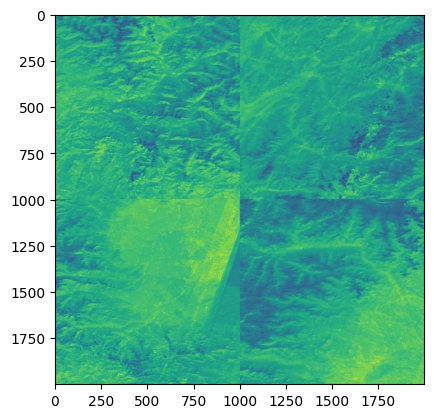

In [84]:
import h5py
import os

def read_h5(filename):
    #Open the H5 file in read mode
    with h5py.File(filename, 'r') as file:
        tmp = torch.Tensor(file["Temperature"]["Mean"])
        tmp = torch.where(tmp==-9999, tmp[tmp!=0].mean(), tmp)
        return tmp.reshape(1, 1, tmp.shape[-2], tmp.shape[-1])

# Building the original image (check order)
AG100list = [item for item in sorted(os.listdir()) if item.endswith(".h5") and item.startswith("AG100")]
AG1kmlist = [item for item in sorted(os.listdir()) if item.endswith(".h5") and item.startswith("AG1km")]
AG100 = torch.cat([read_h5(item) for item in AG100list], 0)
AG1km = torch.cat([read_h5(item) for item in AG1kmlist], 0)

def large(databatch):
    n,_,h,w = databatch.shape
    outdim = int(n**(1/2))
    coords = draw_tiles_coords(h, h*outdim,w*outdim)
    tmp = torch.zeros((h*outdim,w*outdim))
    for i, (y0,y1,x0,x1) in enumerate(coords):
        tmp[y0:y1, x0:x1] = databatch[i,:,:,:]
    return tmp

plt.imshow(large(AG100))
# Getting the data


In [ ]:
# Load MODIS dataset
filename  = "AG1km.v003.46.007.0010.h5"
layername = "LST_Day_1km"
SF        = 0.02  # MODIS scale factor
tile_size      = 200   # dimension of each square subpatch
nitems_train   = 16    # amount of subpatches to be used as train set
batch_size     = 8     # batch dimension
nimage_to_plot = 4     # amount of subpatches to be plotted

# Read data
data = read_rescale(filename, layername)
data = preprocess_data(data)

# Upper and lower value limits for visualisation purposes
llim, ulim = get_low_up_lim(data, nstd=2.5)

# Collect train, test subpatches
h, w = data.shape
subtiles_coords = draw_tiles_coords(tile_size, h, w)
hr_train, hr_test = train_test_split(data, nitems_train, subtiles_coords)

# to speed up: reducing hr_test size == batch_size
#hr_test = hr_test[0:batch_size, :, :, :]

# Get LR counterpart by bicubic interpolation (pre-upsampling)
UP_SCALE = 10
child_up_train = get_lr(hr_train, scale_factor=UP_SCALE)
child_up_test  = get_lr(hr_test, scale_factor=UP_SCALE)

# Plot original image
plt.imshow(data, vmin = llim, vmax = ulim)
plt.suptitle("Original MODIS HR acquisition")
plt.colorbar()
plt.show()

# Plot HR subpatches (Train set)
plotsubpatch(subpatches = hr_train[0:nimage_to_plot],
             titles = [f"subpatch{i}" for i in range(nimage_to_plot)],
             suptitle = "Original HR subpatches, Train set",
             llim=llim, ulim=ulim)

# Plot LR subpatches (Train set)
plotsubpatch(subpatches = child_up_train[0:nimage_to_plot],
            titles = [f"subpatch{i}" for i in range(nimage_to_plot)],
            suptitle = "Degradating original HR subpatches from Train set",
            llim=llim, ulim=ulim)

# Plot HR subpatches (Train set)
plotsubpatch(subpatches = hr_test[0:nimage_to_plot],
             titles = [f"subpatch{i}" for i in range(nimage_to_plot)],
             suptitle = "Original HR subpatches, Test set",
             llim=llim, ulim=ulim)

# Plot LR subpatches (Train set)
plotsubpatch(subpatches = child_up_test[0:nimage_to_plot],
            titles = [f"subpatch{i}" for i in range(nimage_to_plot)],
            suptitle = "Degradating original HR subpatches from Test set",
            llim=llim, ulim=ulim)